<a href="https://colab.research.google.com/github/xAn-x/Vision-Lab/blob/master/04%20Conditional%20VAE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
%pip install lightning -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 811.0/811.0 kB 32.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 869.5/869.5 kB 44.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 37.4 MB/s eta 0:00:00


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# sns.set_style("whitegrid")

import torch
import torch.nn as nn
import torch.nn.functional as F
import lightning as L

In [5]:
DEVICE='cuda' if torch.cuda.is_available() else 'cpu'
DEVICE

'cuda'

In [6]:
from torchvision import datasets
from torchvision import transforms as T
from torch.utils.data import DataLoader
from pathlib import Path


train_ds=datasets.MNIST(root="data",train=True,download=True,transform=T.ToTensor())
valid_ds=datasets.MNIST(root="data",train=False,download=False,transform=T.ToTensor())

len(train_ds),len(valid_ds)

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 9912422/9912422 [00:02<00:00, 4575927.09it/s]


Extracting data/MNIST/raw/train-images-idx3-ubyte.gz to data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 28881/28881 [00:00<00:00, 134620.19it/s]


Extracting data/MNIST/raw/train-labels-idx1-ubyte.gz to data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 1648877/1648877 [00:01<00:00, 1267872.15it/s]


Extracting data/MNIST/raw/t10k-images-idx3-ubyte.gz to data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 4542/4542 [00:00<00:00, 8844256.62it/s]


Extracting data/MNIST/raw/t10k-labels-idx1-ubyte.gz to data/MNIST/raw



(60000, 10000)

In [7]:
train_dl=DataLoader(train_ds,batch_size=64,shuffle=True,pin_memory=True,num_workers=2)
valid_dl=DataLoader(valid_ds,batch_size=128,shuffle=False,pin_memory=True,num_workers=2)

len(train_dl),len(valid_dl)

(938, 79)

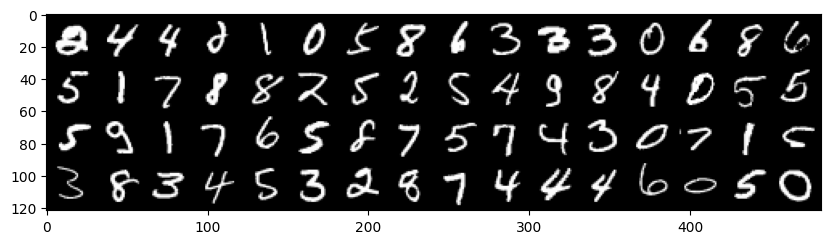

In [8]:
from torchvision.utils import make_grid

for images,labels in train_dl:
  grid=make_grid(images,nrow=16)
  plt.figure(figsize=(10,12))
  plt.imshow(grid.permute(1,2,0))
  break

In [181]:
import torch.optim as optim
from collections import defaultdict

class Dense(nn.Module):
  def __init__(self, in_features, out_features, dropout=0.2):
    super().__init__()
    self.dense = nn.Sequential(
      nn.Linear(in_features, out_features),
      nn.SELU(inplace=True),
      nn.BatchNorm1d(out_features),
      nn.Dropout(dropout)
    )

  def forward(self,X:torch.Tensor)->torch.Tensor:
    return self.dense(X)



class ConditionalVAE(L.LightningModule):
  def __init__(self,encoder_config:list[tuple[int,int]]|tuple[tuple[int,int]],latent_dim:int,decoder_config:list[tuple[int,int]]|tuple[tuple[int,int]],num_classes=10,dropout=0.2):
    super().__init__()
    self.latent_dim = latent_dim
    self.num_classes = num_classes
    self.alpha=0.001
    assert decoder_config[0][0] == latent_dim+num_classes,f"Invalid input dimensions of decoder, must be :(latent_dim+num_classes)[f{latent_dim+num_classes}]"


    self.encoder = nn.Sequential(*[Dense(in_features, out_features,dropout=dropout) for in_features, out_features in encoder_config])

    self.z_mean=nn.LazyLinear(latent_dim)
    self.z_log_var=nn.LazyLinear(latent_dim)

    decoder=[Dense(in_features, out_features,dropout=dropout) for in_features, out_features in decoder_config]
    decoder.append(nn.Sigmoid())
    self.decoder = nn.Sequential(*decoder)

    self.history=defaultdict(list)
    self.temp_history=defaultdict(list)


  def reparameterize(self,mu, log_var):
    eps=torch.rand_like(mu).to(mu.device)
    return mu + torch.exp(0.5 * log_var) * eps

  def decode(self,z,labels):
    labels=labels.long()
    recontructed_x=torch.cat([z,F.one_hot(labels,num_classes=self.num_classes)],dim=-1)
    return recontructed_x

  def forward(self,X,Y):
    inp_shape=X.shape
    X=X.view(X.shape[0],-1)
    X = self.encoder(X)

    z_mean = self.z_mean(X)
    z_log_var = self.z_log_var(X)
    z=self.reparameterize(z_mean, z_log_var)

    recontructed_x=self.decode(z,Y)
    X = self.decoder(recontructed_x)
    X=X.view(inp_shape)

    return X,z_mean, z_log_var

  def configure_optimizers(self, lr=3e-4):
    optimizer = optim.Adam(self.parameters(), lr=lr)
    scheduler = {
      'scheduler': optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10, eta_min=0, verbose=True),
      'monitor': 'val_loss'
    }
    return [optimizer], [scheduler]


  def common_step(self, batch, split):
    X, y = batch
    out, z_mean, z_log_var = self(X,y)

    reconstruction_loss=F.mse_loss(X, out)
    kl_loss = -0.5 * torch.sum(1 + z_log_var - z_mean.pow(2) - z_log_var.exp())
    kl_loss=torch.mean(kl_loss)
    loss = reconstruction_loss + self.alpha * kl_loss

    self.log(f'{split}_loss', loss)
    self.log(f'{split}_reconstruction_loss', reconstruction_loss)
    self.log(f'{split}_kl_loss', kl_loss)

    self.temp_history[f'{split}_loss'].append(loss.detach().cpu().item())
    self.temp_history[f'{split}_reconstruction_loss'].append(reconstruction_loss.detach().cpu().item())
    self.temp_history[f'{split}_kl_loss'].append(kl_loss.detach().cpu().item())

    return loss

  def training_step(self, batch, batch_idx):
    loss=self.common_step(batch,'train')
    return loss

  def validation_step(self, batch, batch_idx):
    if batch_idx==0:
      out,z_mean, z_log_var = self(*batch)
      gen_images=make_grid(out,nrow=16)
      self.logger.experiment.add_image('generated_images',gen_images,self.current_epoch)
      self.history["generated_images"].append(gen_images)

    loss=self.common_step(batch,'val')
    return loss

  def on_train_epoch_end(self):
    self.on_epoch_end('train')

  def on_validation_epoch_end(self):
    self.on_epoch_end('val')

  def on_epoch_end(self ,split: str):
    for loss in ['loss','reconstruction_loss','kl_loss']:
      name=f"{split}_{loss}"
      l=np.mean(np.array(self.temp_history[f"{split}_{loss}"]))
      print(f"{name}:{l.item():.4f}")
      self.history[name].append(l)
      self.temp_history[name].clear()
    print()
    if(split=='train'):
      print("*"*30)


  def predict_step(self, X,labels:None) -> torch.Tensor:
    if labels is None:
      labels = torch.randint(low=0, high=self.num_classes, size=(X.shape[0],)).to(X.device)
    X, z_mean, z_log_var = self(X,labels)
    return X,labels

In [182]:
encoder_config = [(784, 96), (96, 128), (128, 64),(64,8)]
latent_dim=16
num_classes=10
decoder_config = [(latent_dim+num_classes, 64), (64,96), (96,128), (128, 784)]


model=ConditionalVAE(encoder_config,latent_dim,decoder_config,num_classes).to(DEVICE)
model

ConditionalVAE(
  (encoder): Sequential(
    (0): Dense(
      (dense): Sequential(
        (0): Linear(in_features=784, out_features=96, bias=True)
        (1): SELU(inplace=True)
        (2): BatchNorm1d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (3): Dropout(p=0.2, inplace=False)
      )
    )
    (1): Dense(
      (dense): Sequential(
        (0): Linear(in_features=96, out_features=128, bias=True)
        (1): SELU(inplace=True)
        (2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (3): Dropout(p=0.2, inplace=False)
      )
    )
    (2): Dense(
      (dense): Sequential(
        (0): Linear(in_features=128, out_features=64, bias=True)
        (1): SELU(inplace=True)
        (2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (3): Dropout(p=0.2, inplace=False)
      )
    )
    (3): Dense(
      (dense): Sequential(
        (0): Linear(in_features=64, out_featu

In [183]:
imgs=torch.randn((2,1,28,28)).to(DEVICE)
labels=torch.randint(0,10,(2,)).to(DEVICE)

out,mu,var=model(imgs,labels)
out.shape,mu.shape,var.shape

(torch.Size([2, 1, 28, 28]), torch.Size([2, 16]), torch.Size([2, 16]))

In [168]:
print(f"Encoder-params:{sum([p.numel() for p in model.encoder.parameters()])}")
print(f"Decoder-params:{sum([p.numel() for p in model.decoder.parameters()])}")
print(f"Total-params:{sum([p.numel() for p in model.parameters()])}")

Encoder-params:97144
Decoder-params:123664
Total-params:221096


In [ ]:
# import shutil
# shutil.rmtree("logs")

In [186]:
from lightning import Trainer
from lightning.pytorch.loggers import TensorBoardLogger
from lightning.pytorch.callbacks import EarlyStopping, ModelCheckpoint

logger = TensorBoardLogger(save_dir="logs", name="ConditionalVAE")
callbacks=[EarlyStopping(monitor='val_loss', patience=4, mode='min',min_delta=0.001),ModelCheckpoint(monitor='val_loss', save_top_k=1, mode='min',verbose=False,dirpath='checkpoints')]
trainer = Trainer(accelerator=DEVICE,devices='auto', max_epochs=20, logger=logger, callbacks=callbacks,fast_dev_run=False,strategy='auto')

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [187]:
trainer.fit(model,train_dl,valid_dl)

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /content/checkpoints exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
INFO: 
  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | Sequential | 97.1 K | train
1 | z_mean    | Linear     | 144    | train
2 | z_log_var | Linear     | 144    | train
3 | decoder   | Sequential | 123 K  | train
-------------------------------------------------
221 K     Trainable params
0         Non-trainable params
221 K     Total params
0.884     Total estimated model params size (MB)
53        Modules in train mode
0         Modules in eval m

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

val_loss:0.3322
val_reconstruction_loss:0.2299
val_kl_loss:102.2258



Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.1875
val_reconstruction_loss:0.1816
val_kl_loss:5.8614

train_loss:0.2989
train_reconstruction_loss:0.2150
train_kl_loss:83.9225

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.1579
val_reconstruction_loss:0.1575
val_kl_loss:0.3273

train_loss:0.1858
train_reconstruction_loss:0.1750
train_kl_loss:10.7762

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.1143
val_reconstruction_loss:0.1142
val_kl_loss:0.0743

train_loss:0.1521
train_reconstruction_loss:0.1498
train_kl_loss:2.2742

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0982
val_reconstruction_loss:0.0982
val_kl_loss:0.0226

train_loss:0.1297
train_reconstruction_loss:0.1292
train_kl_loss:0.4745

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0898
val_reconstruction_loss:0.0898
val_kl_loss:0.0249

train_loss:0.1195
train_reconstruction_loss:0.1194
train_kl_loss:0.1085

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0846
val_reconstruction_loss:0.0846
val_kl_loss:0.0108

train_loss:0.1137
train_reconstruction_loss:0.1137
train_kl_loss:0.0333

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0825
val_reconstruction_loss:0.0825
val_kl_loss:0.0045

train_loss:0.1096
train_reconstruction_loss:0.1096
train_kl_loss:0.0131

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0818
val_reconstruction_loss:0.0818
val_kl_loss:0.0024

train_loss:0.1067
train_reconstruction_loss:0.1067
train_kl_loss:0.0054

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0814
val_reconstruction_loss:0.0814
val_kl_loss:0.0017

train_loss:0.1044
train_reconstruction_loss:0.1044
train_kl_loss:0.0025

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0811
val_reconstruction_loss:0.0811
val_kl_loss:0.0015

train_loss:0.1037
train_reconstruction_loss:0.1037
train_kl_loss:0.0018

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0813
val_reconstruction_loss:0.0813
val_kl_loss:0.0015

train_loss:0.1036
train_reconstruction_loss:0.1036
train_kl_loss:0.0017

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0811
val_reconstruction_loss:0.0810
val_kl_loss:0.0016

train_loss:0.1034
train_reconstruction_loss:0.1034
train_kl_loss:0.0015

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0798
val_reconstruction_loss:0.0798
val_kl_loss:0.0013

train_loss:0.1029
train_reconstruction_loss:0.1029
train_kl_loss:0.0010

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0778
val_reconstruction_loss:0.0778
val_kl_loss:0.0036

train_loss:0.1017
train_reconstruction_loss:0.1017
train_kl_loss:0.0009

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0746
val_reconstruction_loss:0.0746
val_kl_loss:0.0055

train_loss:0.1001
train_reconstruction_loss:0.1000
train_kl_loss:0.0016

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0709
val_reconstruction_loss:0.0709
val_kl_loss:0.0136

train_loss:0.0980
train_reconstruction_loss:0.0980
train_kl_loss:0.0046

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0673
val_reconstruction_loss:0.0673
val_kl_loss:0.0089

train_loss:0.0960
train_reconstruction_loss:0.0960
train_kl_loss:0.0077

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0641
val_reconstruction_loss:0.0641
val_kl_loss:0.0530

train_loss:0.0943
train_reconstruction_loss:0.0943
train_kl_loss:0.0102

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0617
val_reconstruction_loss:0.0616
val_kl_loss:0.0442

train_loss:0.0930
train_reconstruction_loss:0.0930
train_kl_loss:0.0189

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


val_loss:0.0597
val_reconstruction_loss:0.0596
val_kl_loss:0.0947

train_loss:0.0920
train_reconstruction_loss:0.0920
train_kl_loss:0.0290

******************************


In [172]:
%reload_ext tensorboard
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 11992), started 0:23:16 ago. (Use '!kill 11992' to kill it.)

<IPython.core.display.Javascript object>

In [194]:
def plot_history(history,metric):
  sns.set_style("whitegrid")
  plt.plot(history[f'train_{metric}'],label='train',c='red')
  plt.plot(history[f'val_{metric}'],label='val',c='purple')
  plt.legend()
  plt.show()

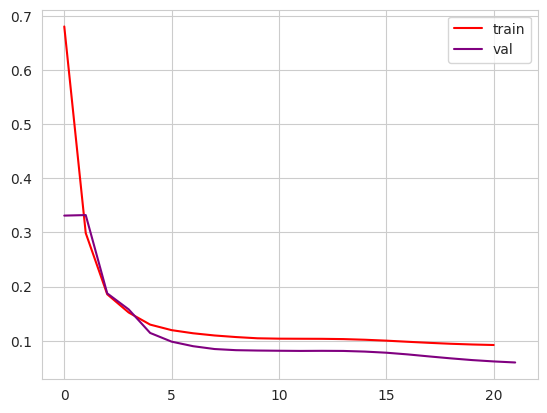

In [195]:
plot_history(model.history,"loss")

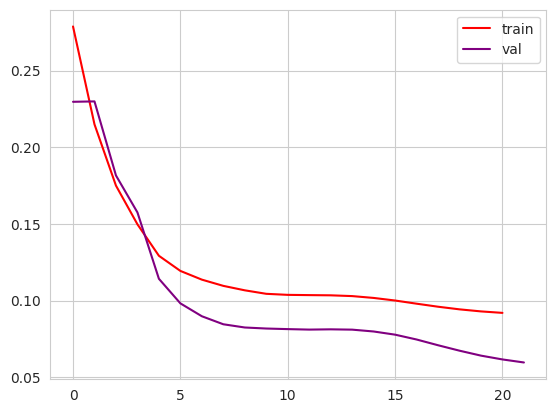

In [196]:
plot_history(model.history,"reconstruction_loss")

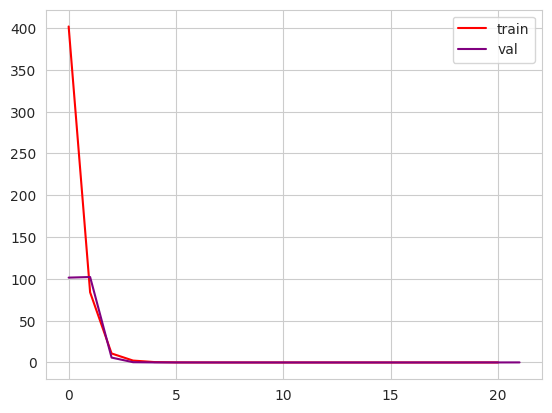

In [197]:
plot_history(model.history,"kl_loss")

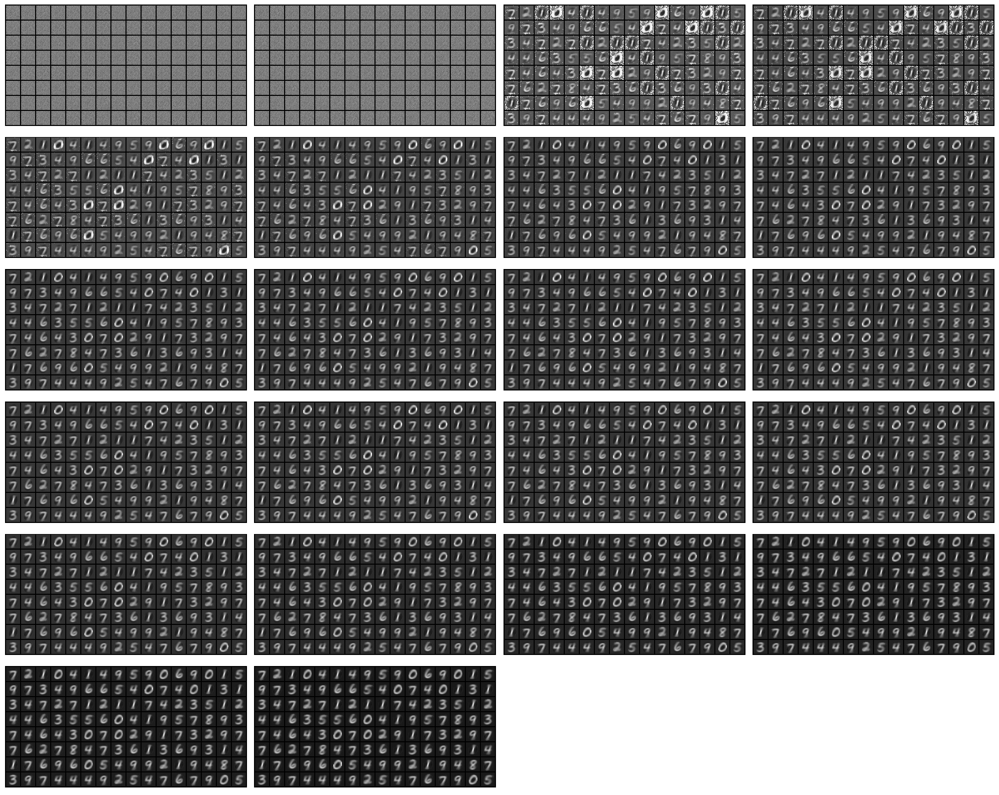

In [227]:
gen_images=model.history['generated_images']

gen_images=torch.stack(gen_images).cpu()

cols = 4
rows =  len(gen_images) // cols + int(len(gen_images) % cols != 0)
fig, axes = plt.subplots(rows,cols, figsize=(20,16))
axes = axes.flatten()  # Flatten axes for easy iteration

for i, images in enumerate(gen_images):
    grid = images
    axes[i].imshow(grid.permute(1, 2, 0))
    axes[i].axis('off')

for j in range(i + 1, rows * cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [230]:
# sns.set_style("white")

<ipython-input-233-78299e940939>:13: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1,2,1)


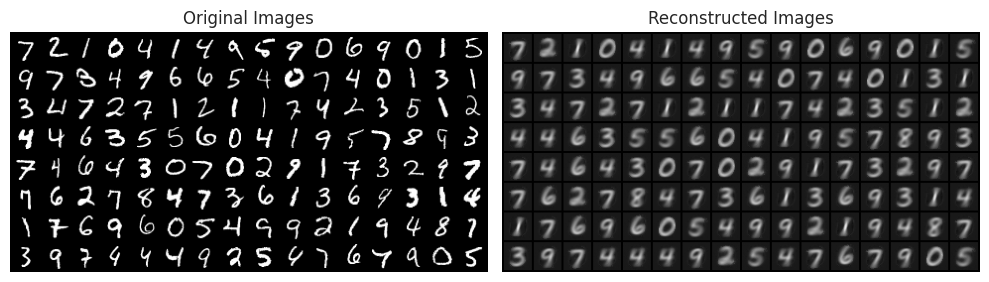

In [233]:
with torch.no_grad():
  model.eval()
  for images,labels in valid_dl:
    # images=images.to(DEVICE)
    # labels=labels.to(DEVICE)
    out,z_mean, z_log_var = model(images,labels)
    plt.figure(figsize=(10,12))
    plt.grid('off')

    out_grid=make_grid(out,nrow=16)
    img_grid=make_grid(images,16)

    plt.subplot(1,2,1)
    plt.imshow(img_grid.permute(1,2,0))
    plt.axis('off')
    plt.title("Original Images")

    plt.subplot(1,2,2)
    plt.imshow(out_grid.permute(1,2,0))
    plt.axis('off')
    plt.title("Reconstructed Images")

    plt.tight_layout()
    plt.show()

    break
  model.train()